# Analysing Data

#### Jump to <a href="#3.-Conclusion">Inital Conclusion</a>
#### Jump to <a href="#Performing-PCA">Priciple Component Analysis</a>
#### Jump to <a href="#Conclusion-:">Final Conclusion</a>

## 1. Importing Data to numpy array

In [56]:
import numpy as np
data = np.genfromtxt("data.txt",names=True)

## 2. Performing Plots to analyse Data

In [5]:
from matplotlib import pyplot as plt
from matplotlib import style
from matplotlib.pyplot import figure

In [6]:
#seperate dataset basing on labels
label1 = data[data['Label'] == 1]
label2 = data[data['Label'] == 2]

### Performing pariwise plots between all features

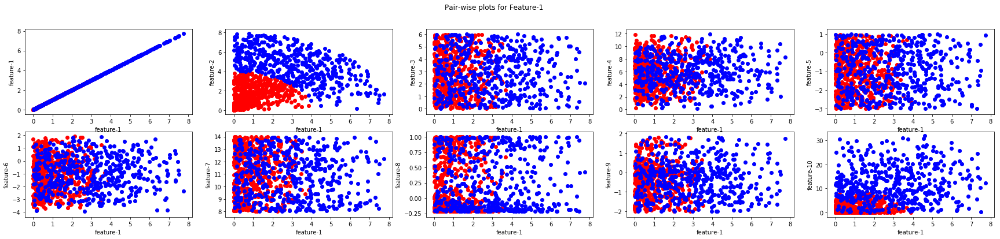

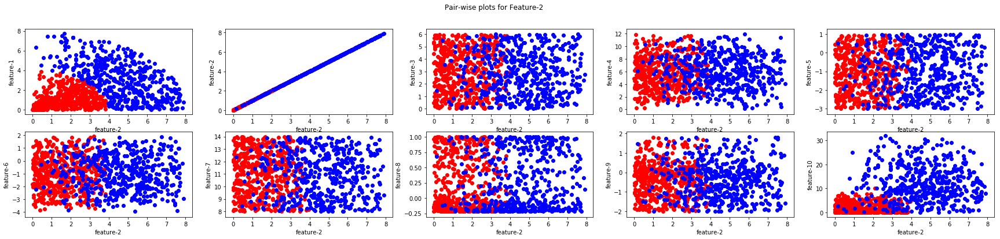

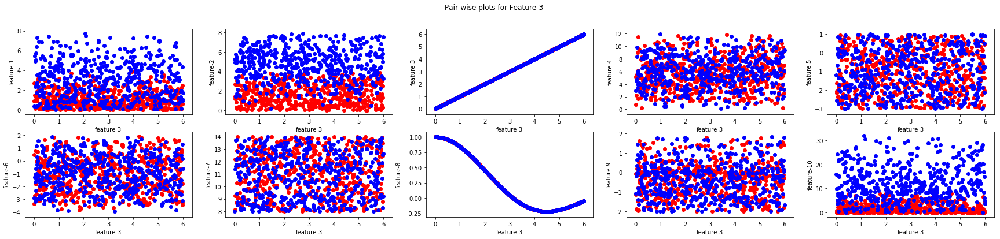

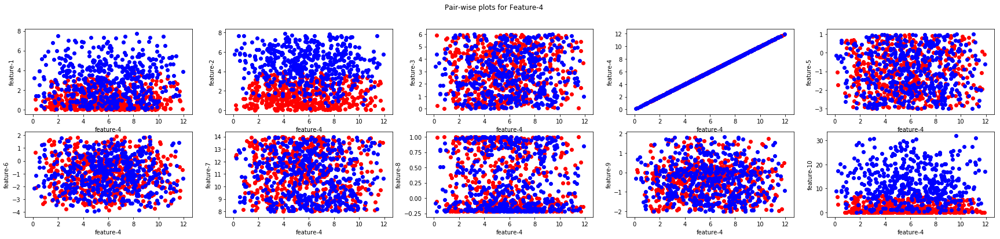

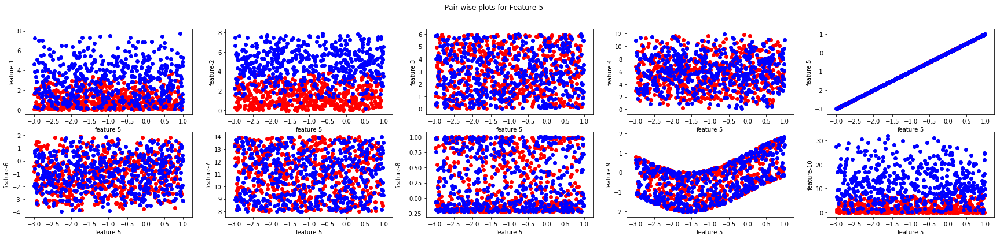

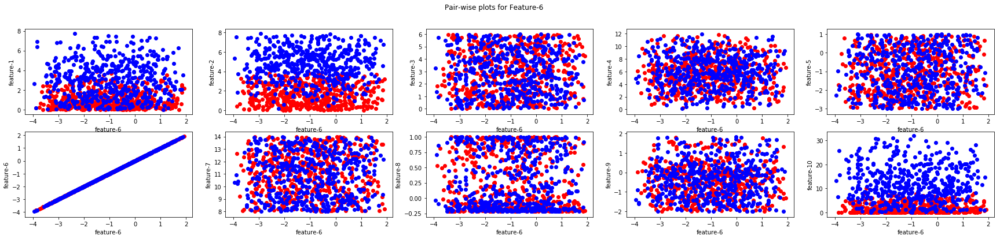

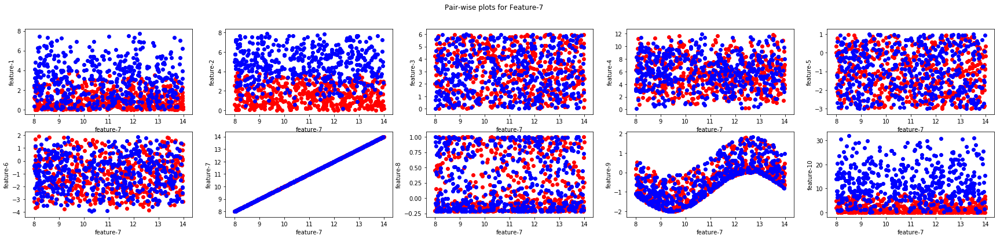

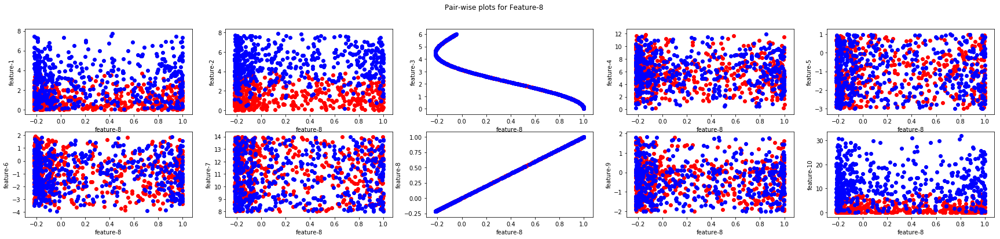

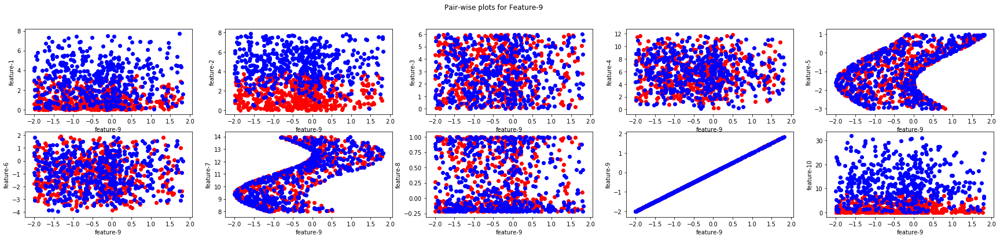

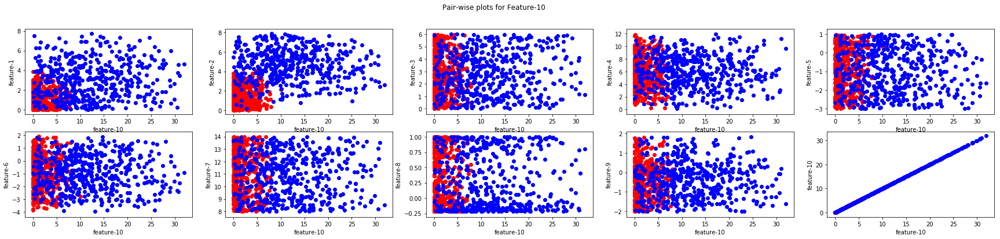

In [11]:
for j in range(1,11):
    f, axs = plt.subplots(2,5,figsize=(30,6))
    f.suptitle("Pair-wise plots for Feature-%d" % j)
    for i,fe in enumerate(data.dtype.names):
        if(i == 0):
            continue
        s = '%d' % j
        plt.subplot(2,5,i)
        plt.scatter(s,fe,data=label1,c = [1,0,0])
        plt.scatter(s,fe,data=label2,c = [0,0,1])
        plt.xlabel('feature-%s' % s)
        plt.ylabel('feature-%d' % i)
    plt.show()

## Further observe feature 1 vs 2 plot

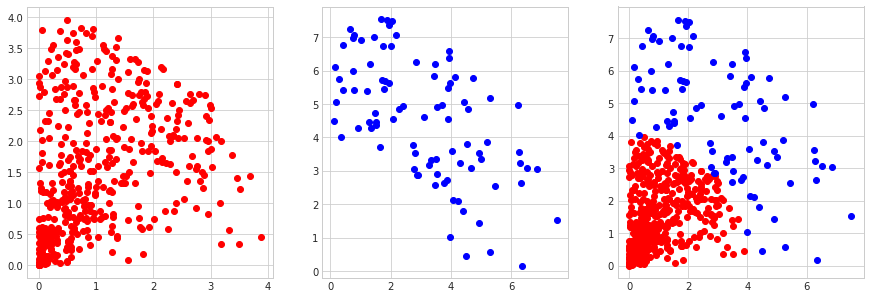

In [74]:
f, axs = plt.subplots(1,2,figsize=(15,5))
plt.subplot(1,3,1)
plt.scatter('1','2',data=label1,c = [1,0,0])
plt.subplot(1,3,2)
plt.scatter('1','2',data=label2,c = [0,0,1])
plt.subplot(1,3,3)
plt.scatter('1','2',data=label1,c = [1,0,0])
plt.scatter('1','2',data=label2,c = [0,0,1])
plt.show()

## 3. Conclusion

### From Above plots We can Observe
* Label-1 and Label-2 are almost seperated

### <i>We can able plot a curve that can almost perfectly classify given Data Basing on Features '1' and '2'</i>

#### * skip-content next prefrebly jump to PCA 
## Jump to <a href="#Performing-PCA">Priciple Component Analysis</a>

In [6]:
data.dtype.names

('Label', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10')

In [29]:
import pandas as pd
df = pd.DataFrame(data=data,index = [i for i in range(data.shape[0])],columns=data.dtype.names)

In [22]:
df.head()

,Label,1,2,3,4,5,6,7,8,9,10
0,2.0,3.201,5.774701,3.429272,0.108732,-0.146594,-2.140013,8.025347,-0.082737,-0.316598,8.970595
1,1.0,1.066,0.519693,5.936320,0.194729,-1.031533,0.678119,12.408875,-0.057266,0.129536,6.406818
2,2.0,1.395,6.184605,4.393927,0.236128,-0.306630,-1.152583,12.271188,-0.216143,0.654902,17.425628
3,1.0,0.062,0.106774,0.227877,0.241525,-1.734883,-2.111483,12.531931,0.991368,0.012839,3.487370
4,2.0,1.416,7.687776,3.696551,0.416807,-0.167303,-1.977925,12.915153,-0.142540,0.773266,20.234659


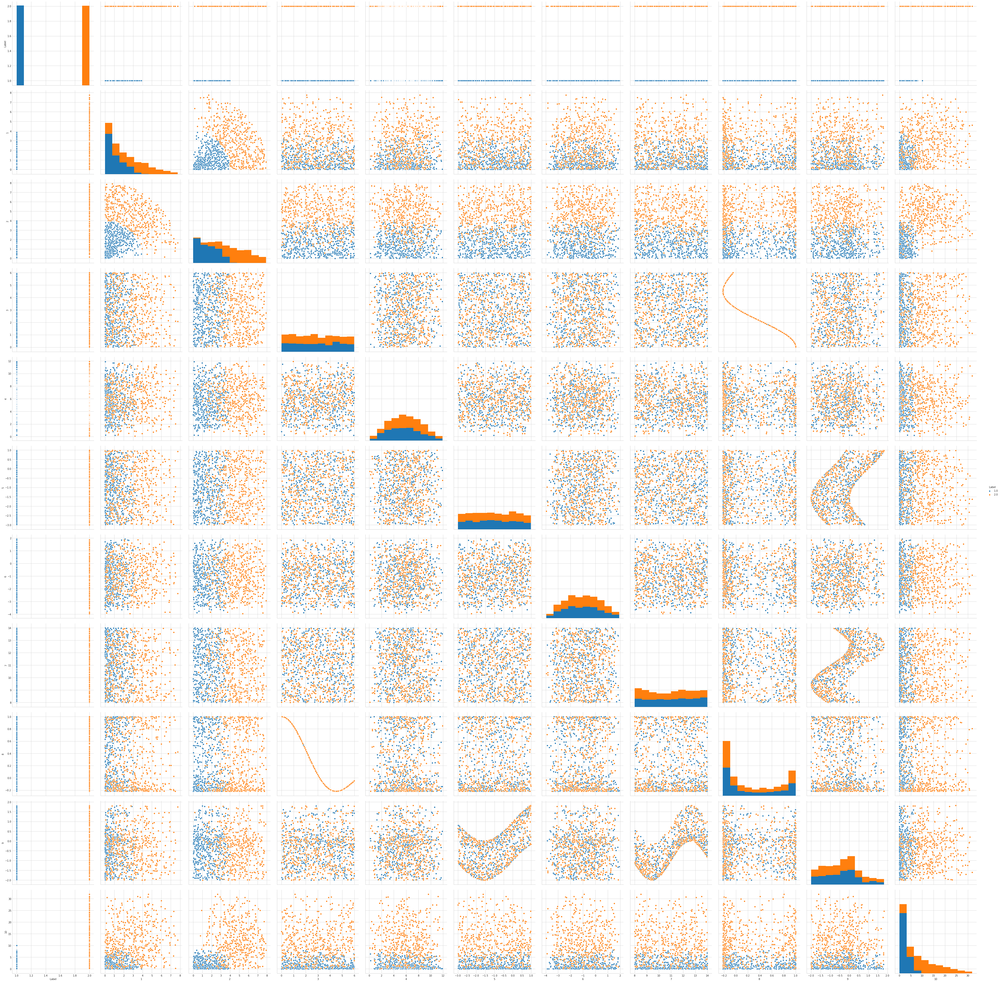

In [15]:
import seaborn as sns
plt.close()
sns.set_style('whitegrid')
sns.pairplot(df,hue='Label',size=5)
plt.show()

### Performing Distribution plots

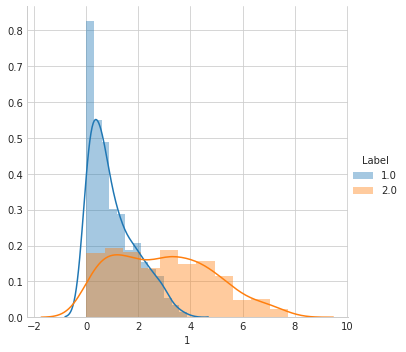

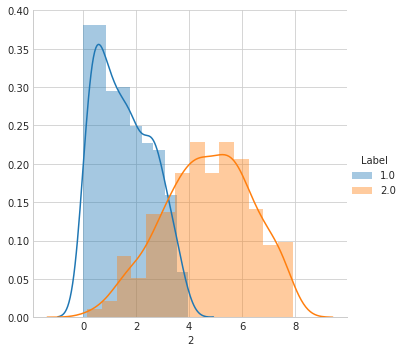

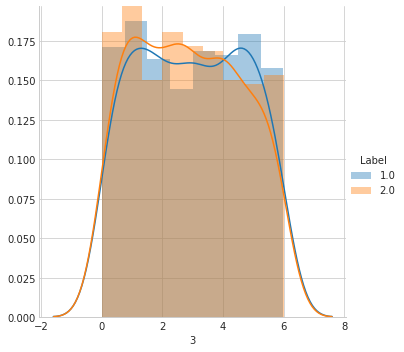

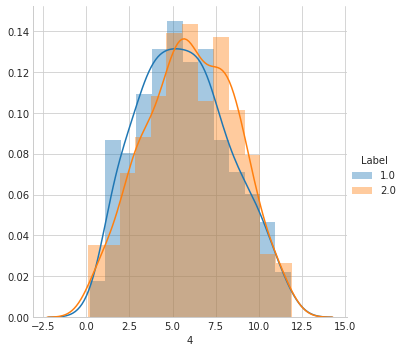

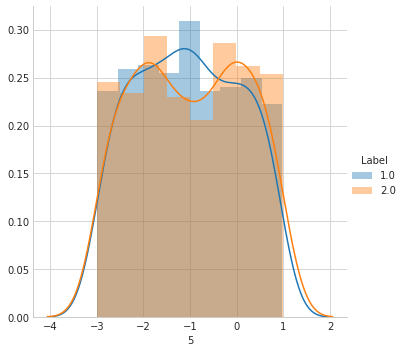

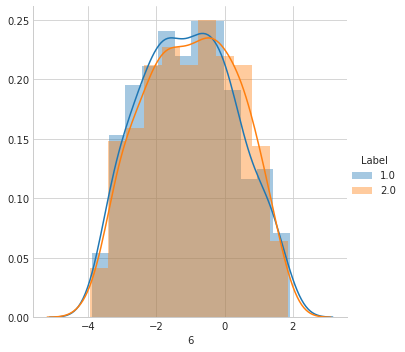

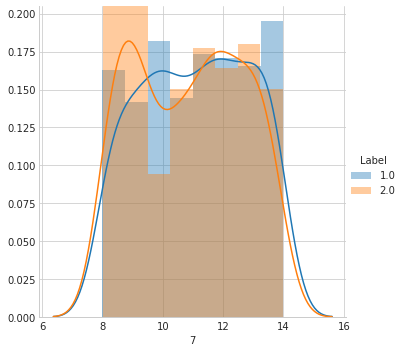

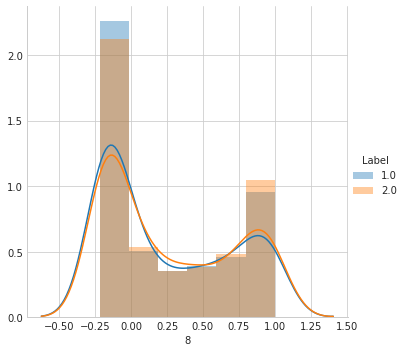

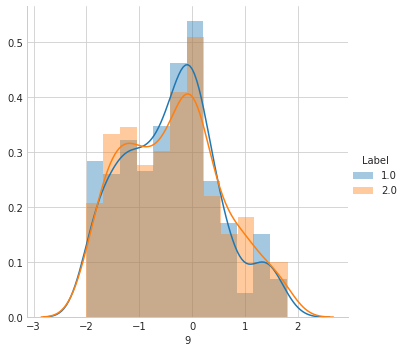

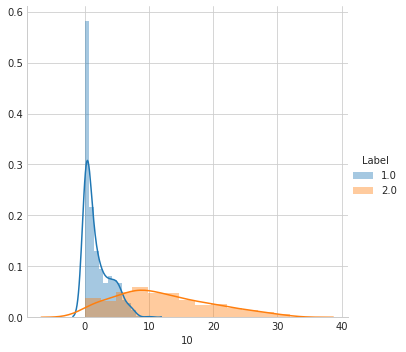

In [32]:
for i in data.dtype.names:
    if(i == 'Label'):
        continue
    sns.FacetGrid(df, hue='Label', size=5).map(sns.distplot, i).add_legend()
    plt.show()

#### From the Graphs you can observe that features '2' and '10' have better seperation

## Let's observe features '2' and '10' further

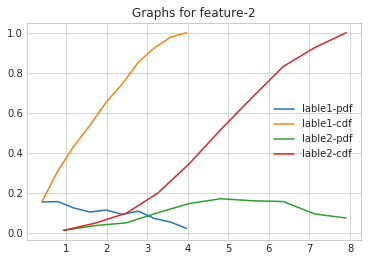

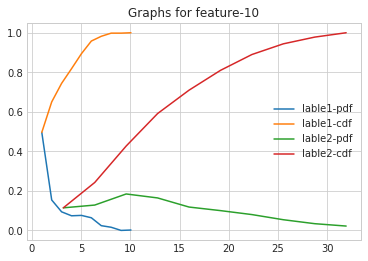

In [41]:
counts, bin_edges = np.histogram(label1['2'], bins=10, density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
plt.title('Graphs for feature-2')
plt.plot(bin_edges[1:],pdf,label='lable1-pdf')
plt.plot(bin_edges[1:],cdf,label='lable1-cdf')
counts, bin_edges = np.histogram(label2['2'], bins=10, density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label='lable2-pdf')
plt.plot(bin_edges[1:],cdf,label='lable2-cdf')
plt.legend()
plt.show()
plt.title('Graphs for feature-10')
counts, bin_edges = np.histogram(label1['10'], bins=10, density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label='lable1-pdf')
plt.plot(bin_edges[1:],cdf,label='lable1-cdf')
counts, bin_edges = np.histogram(label2['10'], bins=10, density = True)
pdf = counts/(sum(counts))
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],pdf,label='lable2-pdf')
plt.plot(bin_edges[1:],cdf,label='lable2-cdf')
plt.legend()
plt.show()

### From the plots you can observe that:
* Around 85% of label1 have feature-'2' less than 3 and less than 19% of label2 have feature-'2' less than 3
* Around 85% of label1 have feature-'10' less than 5 and 20% of label2 have feature-'10' less than 5

In [13]:
fin1 = data[(data['10'] < 5)]
fin2 = data[(data['10'] > 5)]

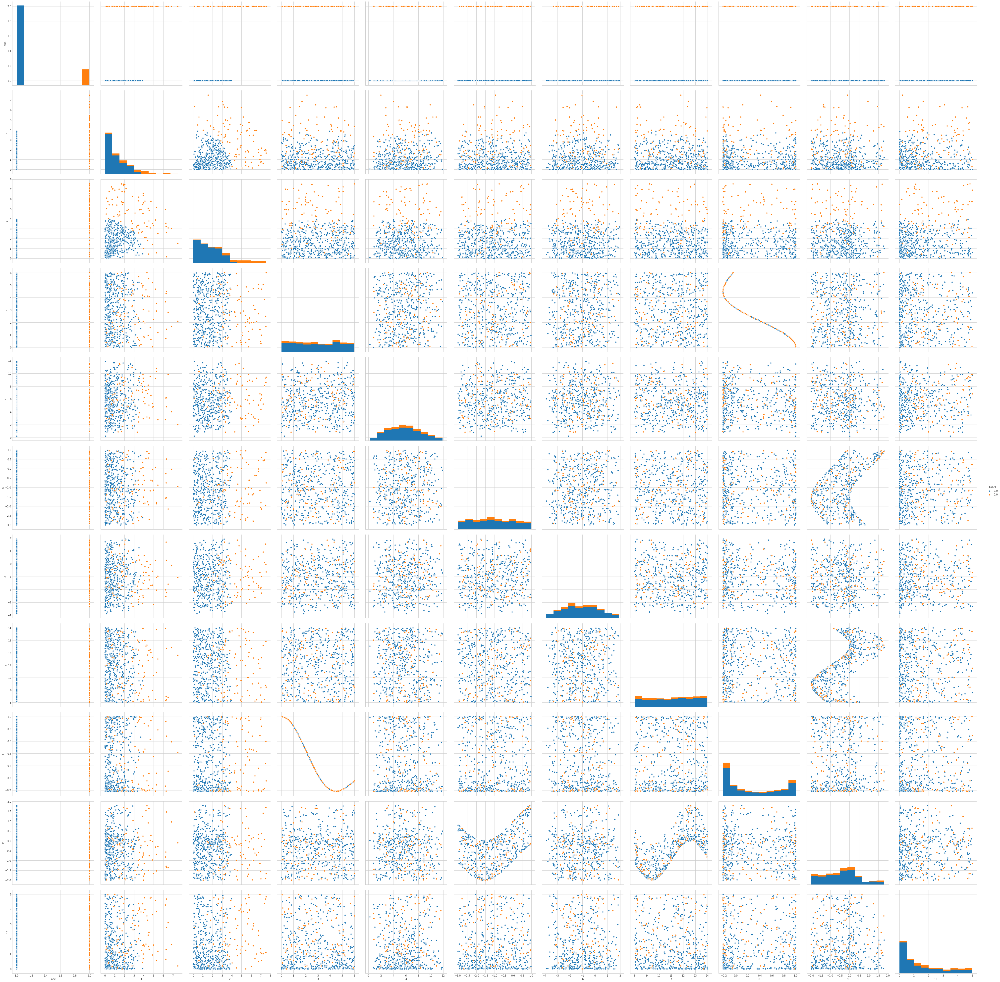

In [61]:
df = pd.DataFrame(fin1)
import seaborn as sns
plt.close()
sns.set_style('whitegrid')
sns.pairplot(df,hue='Label',size=5)
plt.show()

In [16]:
label1 = fin1[fin1['Label'] == 1]
label2 = fin1[fin1['Label'] == 2]
print(label1.shape)
print(label2.shape)

(446,)
(88,)


# Performing PCA

In [63]:
# normalize data
from sklearn.preprocessing import StandardScaler
labels = data['Label']
data_nolabel = data[[i for i in data.dtype.names if i!='Label']]
print(data_nolabel.dtype.names)

('1', '2', '3', '4', '5', '6', '7', '8', '9', '10')


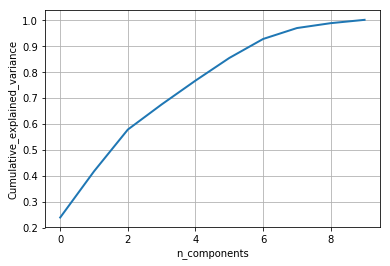

In [114]:
from sklearn import decomposition
pca = decomposition.PCA()
# PCA for dimensionality redcution (non-visualization)
data_scaled = pd.DataFrame(preprocessing.scale(df),columns = df.columns) 
pca.n_components = 10
pca_data = pca.fit_transform(data_scaled)

percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_);

cum_var_explained = np.cumsum(percentage_var_explained)

# Plot the PCA spectrum
plt.figure(1, figsize=(6, 4))

plt.clf()
plt.plot(cum_var_explained, linewidth=2)
plt.axis('tight')
plt.grid()
plt.xlabel('n_components')
plt.ylabel('Cumulative_explained_variance')
plt.show()

* From above you can observe that atleast 6-components are required to retain more than 90% of features

In [101]:
from scipy.linalg import eigh
std_data = StandardScaler().fit_transform(pd.DataFrame(data_nolabel))
cov_mat = np.matmul(std_data.T,std_data)
values, vectors = eigh(cov_mat)
data_ret = (values[9]+values[8])/sum(values)
print(" var_explained %f " % data_ret)
print("PC_1: ",(vectors[9]))
print("PC_2: ",(vectors[8]))

 var_explained 0.373712 
PC_1:  [ 0.01676079 -0.01137148  0.75248105 -0.04750282 -0.01431857  0.04416122
  0.14421697 -0.40960441 -0.47858282  0.10646334]
PC_2:  [-0.01889937 -0.69954843 -0.02956201  0.00230149 -0.01283556 -0.04477033
  0.00212113 -0.55835034  0.40413644 -0.17927799]


* By using two most variant components we can retain only ~37% data
* The components are completly different from features 1 and 2

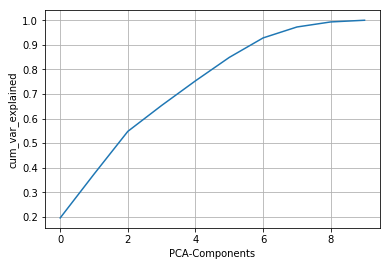

In [96]:
temp = values
temp[::-1].sort()
data_ret = temp/np.sum(temp)
cum_data_ret = np.cumsum(data_ret)
plt.plot(np.arange(10),cum_data_ret)
plt.xlabel('PCA-Components')
plt.ylabel('cum_var_explained')
plt.grid()
plt.show()

In [127]:
print(pca_data.shape,labels.shape)
pca_dta = np.vstack((labels.T,pca_data.T)).T
pca_df = pd.DataFrame(pca_dta,columns=data.dtype.names)
pca_df.head()

(999, 10) (999,)


,Label,1,2,3,4,5,6,7,8,9,10
0,2.0,1.528866,-0.543137,-0.676629,0.223656,0.997022,2.733326,0.232380,-0.759733,0.646722,-0.037837
1,1.0,-1.716910,-1.655971,0.535868,0.694210,2.331834,0.245514,0.735797,0.679608,-0.006054,-0.002886
2,2.0,1.583461,-1.677788,1.249328,1.201756,1.553578,1.576778,-0.719128,0.397212,0.098017,-0.092933
3,1.0,-2.023670,2.331656,1.157257,1.814062,0.713529,0.915072,0.407065,0.640110,0.064929,0.380182
4,2.0,2.117109,-1.415665,1.675770,1.575621,1.098470,1.863149,-1.110775,0.415176,-0.103203,-0.521049


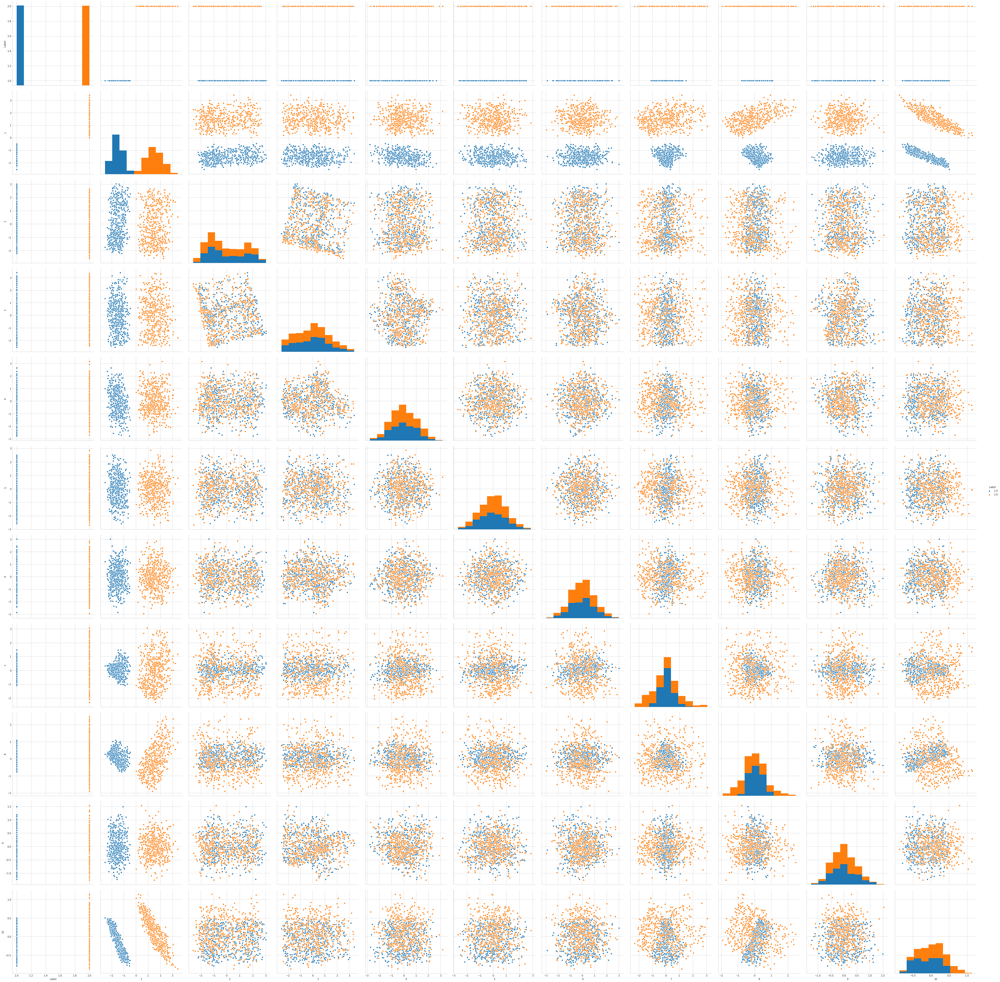

In [129]:
import seaborn as sns
plt.close()
sns.set_style('whitegrid')
sns.pairplot(pca_df,hue='Label',size=5)
plt.show()

## Conclusion : 
* Atleast 6 components are required to retain more than 90% of data variance
* All the components are completely different from original features
* In all the pairplots with one of feature as component-1 data is nicely seperated
* component-1 vs component-10 has more seperation between labels than rest of the plots, Therefore these components are better for classifying data than other.